# Exploratory work for the [IAFlash](https://entrepreneur-interet-general.etalab.gouv.fr/defis/2019/iaflash.html) challenge

## Example of scrapping images from the web to build a labelled dataset

Here we quickly show how we can constitute a database of *labeled* images, by scrapping e.g. second-hand cars websites. Beacause we want French cars, we look at two french websites: [leboncoin](https://www.leboncoin.fr) and [autoscout24](https://www.autoscout24.fr).

Note that this is only an example, no data are actually downloaded, and the process depends on the website used. Also, this does not cover the next step consisting of cleaning the downloaded data depending on our goals, like removing pictures of cars' interiors for instance.

### Imports

In [1]:
import os
HOME = os.path.expanduser('~/')
HOST = os.uname()[1]
if HOST == 'Arthurs-MacBook-Pro.local':
    os.chdir(os.path.join(HOME, 'Documents/GitHub/EIG3_IAFlash/'))    # @home
else:
    raise ValueError('unknown host: {}'.format(HOST))
    
import re

from PIL import Image
import requests
from bs4 import BeautifulSoup

### Variables

In [2]:
# scrapping
url1 = 'https://www.leboncoin.fr/voitures/offres/ile_de_france/' # url of a search arround Paris on leboncoin
url2 = 'https://www.autoscout24.fr/lst?sort=standard&desc=0&offer=J%2CU%2CO%2CD&ustate=N%2CU&cy=F&atype=C' # url of the widest search on autoscout24

### Web scrapping

We use the [`request`](http://docs.python-requests.org/en/master/) and [`BeautifulSoup`](https://www.crummy.com/software/BeautifulSoup/bs4/doc/) packages, respectively for HTTP actions and HTML parsing.

In [3]:
# try leboncoin: need permissions :(

r = requests.get(url1)
print(r.status_code)
print(r.headers['content-type'])
print(r.encoding)
print(r.text)

403
text/html, text/html
ISO-8859-1
<!--
Need permission to access data? Contact: DataAccess@datadome.co
-->
<html><head><title>You have been blocked</title><style>#cmsg{animation: A 1.5s;}@keyframes A{0%{opacity:0;}99%{opacity:0;}100%{opacity:1;}}</style></head><body style="margin:0"><p id="cmsg">Please enable JS and disable any ad blocker</p><script>var dd={'cid':'AHrlqAAAAAMAr6R3EjwW-bUATsJTSw==','hsh':'05B30BD9055986BD2EE8F5A199D973'}</script><script src="https://ct.datadome.co/c.js"></script></body></html>



In [5]:
# but with a 'less known' site, it works

r = requests.get(url2)
print(r.status_code)
print(r.headers['content-type'])
print(r.encoding)
html = r.text
soup = BeautifulSoup(html)

# -> explore this print manually to find the balises that contain relevant information:
# print(soup.prettify())

200
text/html; charset=UTF-8
UTF-8


In [6]:
# -> model names are in the text balises 'h2', with class 'cldt-summary-makemodel sc-font-bold sc-ellipsis'

models_balises = soup.find_all('h2',attrs={'class':'cldt-summary-makemodel sc-font-bold sc-ellipsis'})
models = [x.text for x in models_balises]
nbModels = len(models)

In [7]:
# -> multiple urls are in the 'data-images' attribute of balises 'as24-listing-summary-image'

imgUrlList_balises = soup.find_all('as24-listing-summary-image',attrs={'class':'shine'})
imgUrlList = []
for x in imgUrlList_balises:
    urls = x['data-images'] # 'data-images' actually contains multiple urls, that we must split and clean to make a list
    urlList = urls.split(',')
    urlListClean = [re.findall('(.*)/{size}.{format}',u)[0] for u in urlList]
    imgUrlList.append(urlListClean)
nbUrls = len(imgUrlList)

In [8]:
# example of urls
i = 2
print(models[i])
for u in imgUrlList[i]:
    print(u)

Renault Master
https://prod.pictures.autoscout24.net/listing-images/306a5880-a46a-4ccd-8521-7349877035bb_1c8432e9-8993-4e70-b8ac-4019b114e0a7.jpg
https://prod.pictures.autoscout24.net/listing-images/306a5880-a46a-4ccd-8521-7349877035bb_538a299d-a8be-4be0-865f-1717a978e188.jpg
https://prod.pictures.autoscout24.net/listing-images/306a5880-a46a-4ccd-8521-7349877035bb_75d23c95-1731-4ae7-bec3-26b5e77c12d1.jpg
https://prod.pictures.autoscout24.net/listing-images/306a5880-a46a-4ccd-8521-7349877035bb_20d1268d-8525-4e34-8bee-2bf56848f5e4.jpg




----- Ford Focus -----


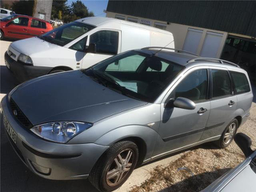

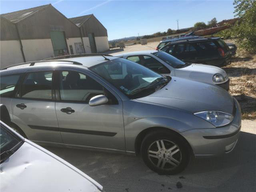

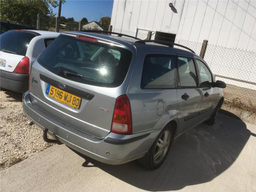

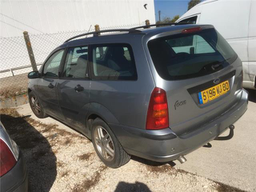



----- Renault Master -----


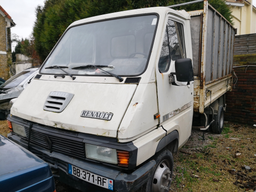

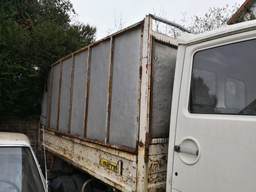

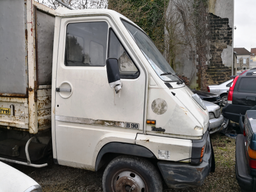

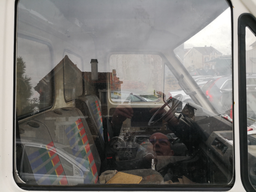



----- Renault Clio -----


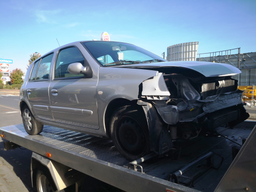

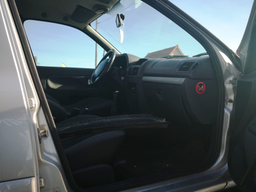

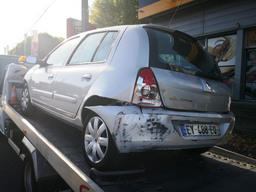

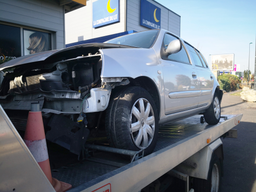



----- Volvo XC70 -----


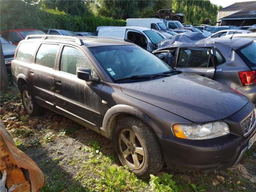

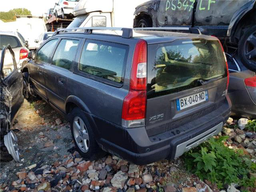

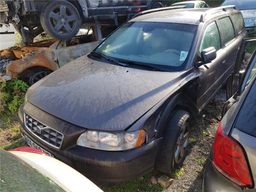

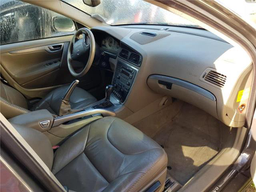



----- Opel Zafira -----


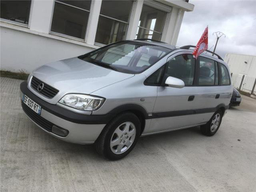

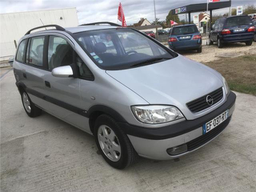

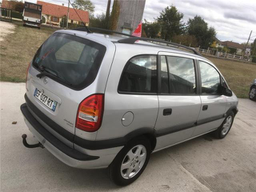

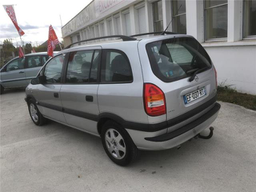

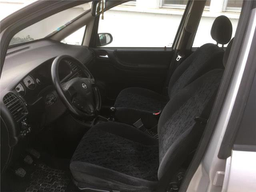

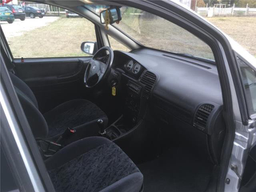

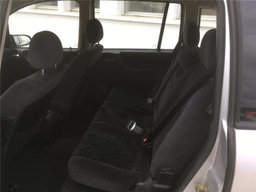

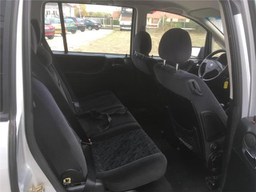

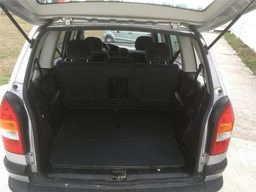



----- Citroen C4 -----


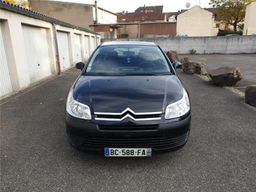

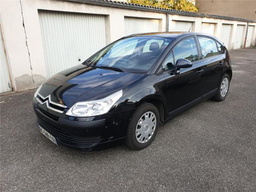

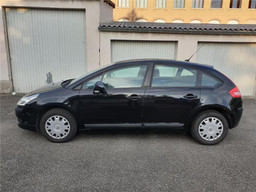

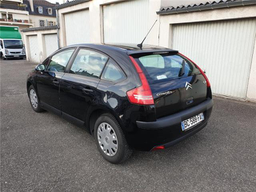

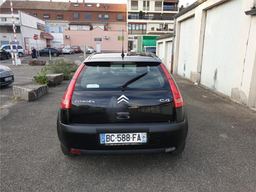

...

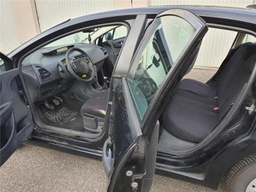

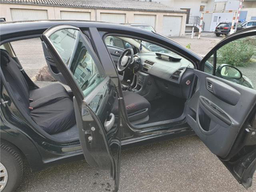

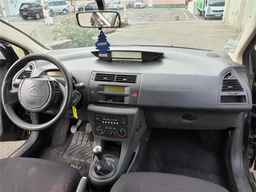

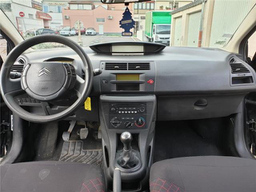

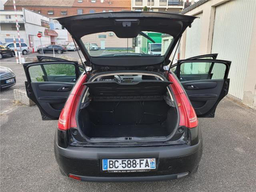



----- Renault Clio -----


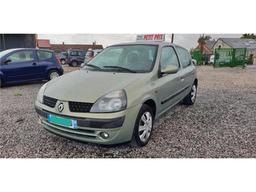

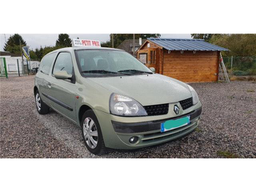

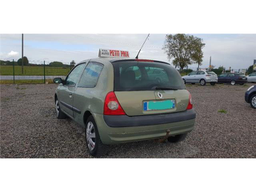

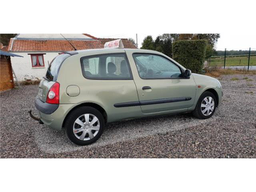

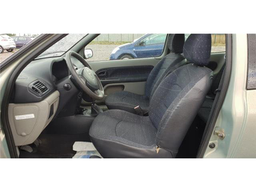

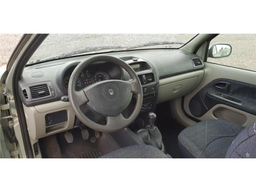



----- Peugeot 406 -----


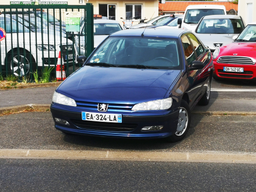

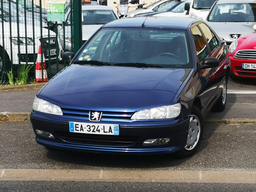

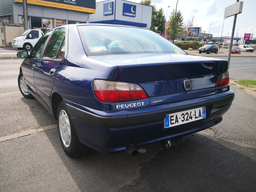

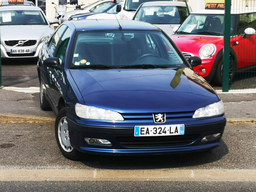

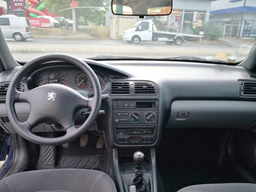

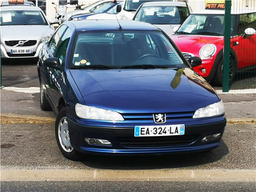

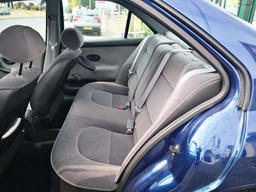

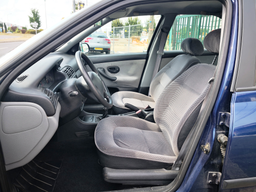

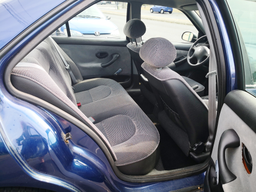

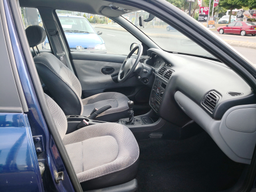



----- Renault Clio -----


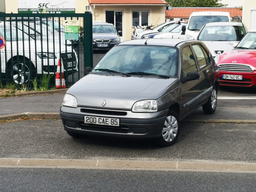

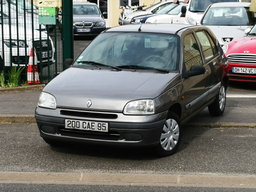

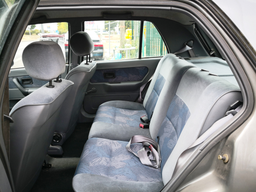

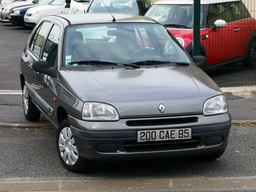

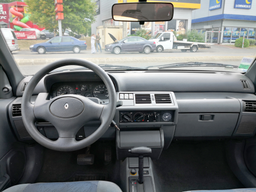

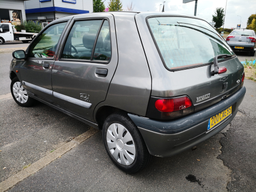

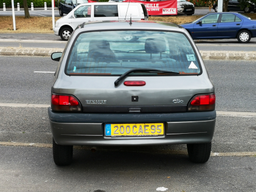

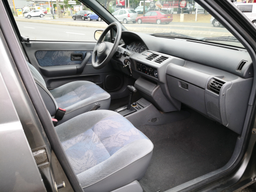

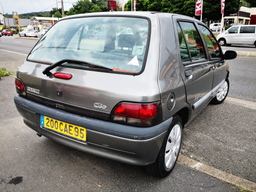

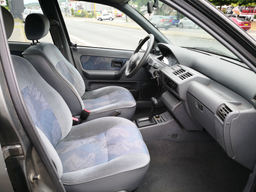



----- Volvo V40 -----


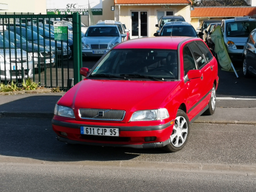

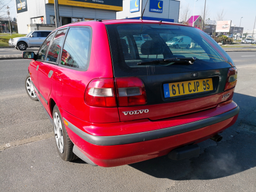

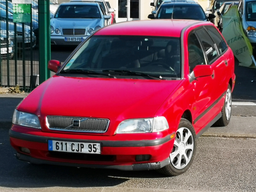

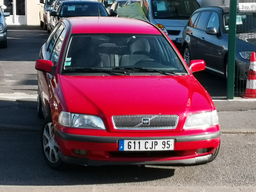

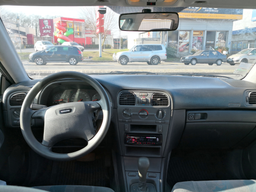

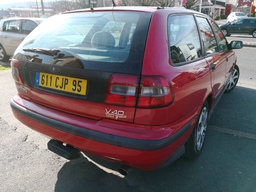

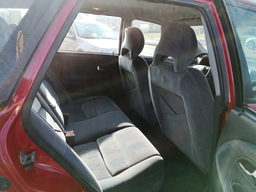

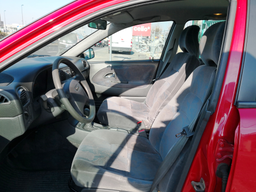

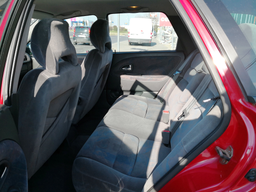

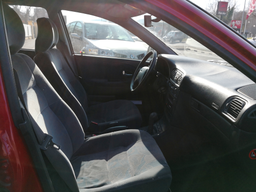



----- BMW 520 -----


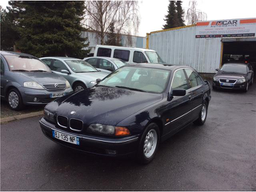

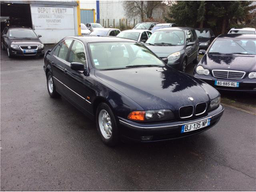

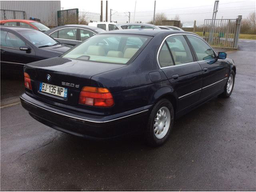

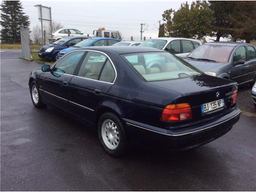

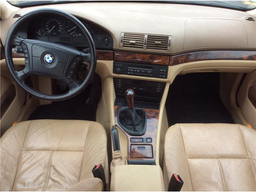

...

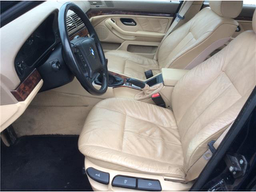

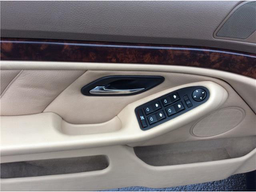

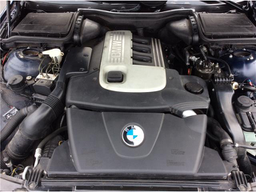

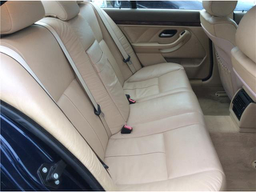

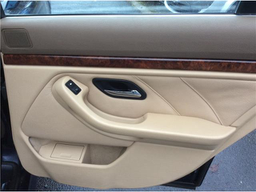



----- Citroen C2 -----


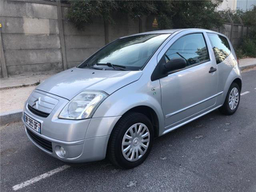

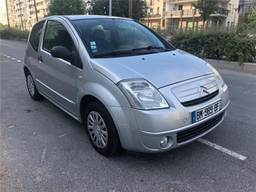

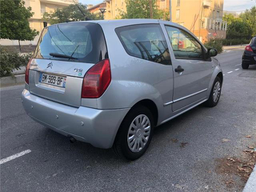

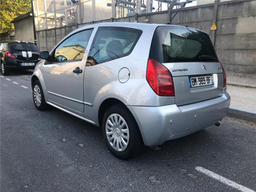

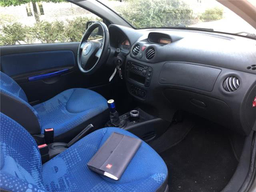

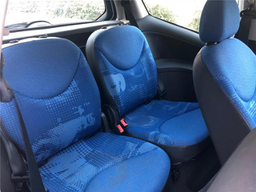



----- Peugeot 307 -----


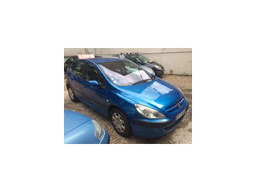

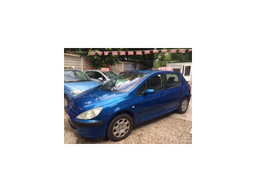

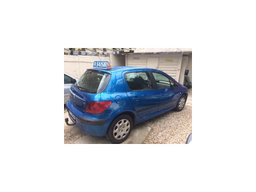

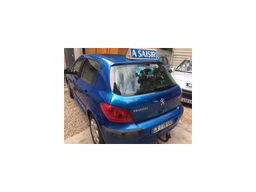

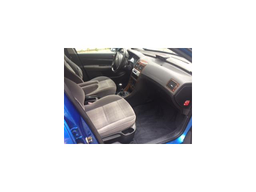



----- Citroen C8 -----


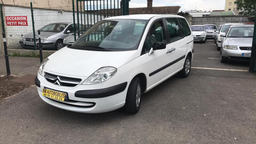

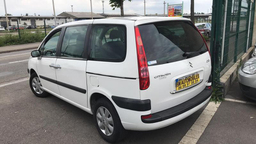

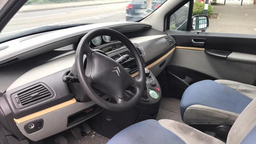

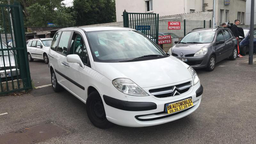

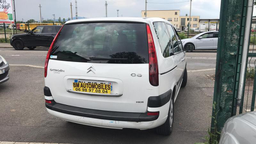



----- Opel Zafira -----


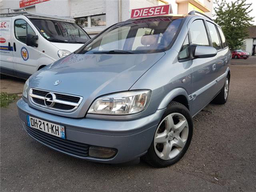

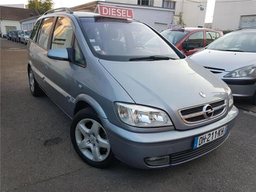

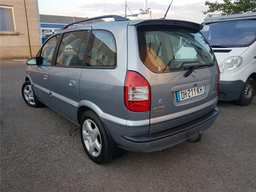

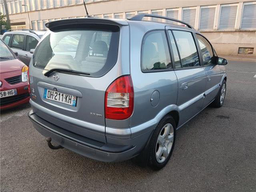

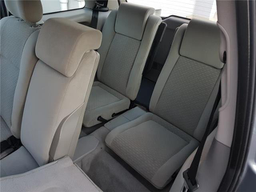

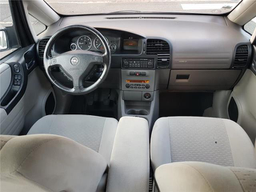

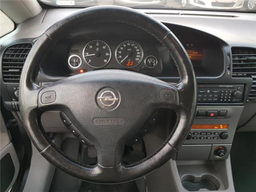

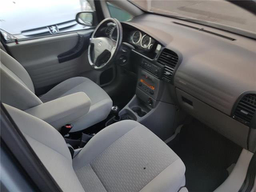

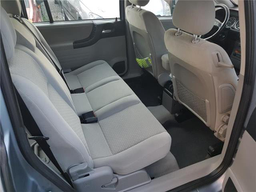



----- Renault Kangoo -----


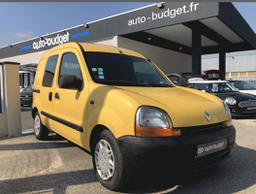

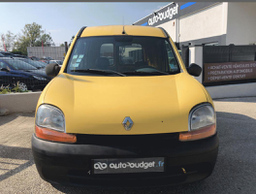

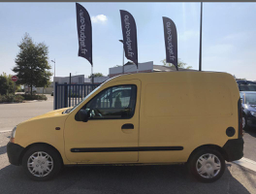

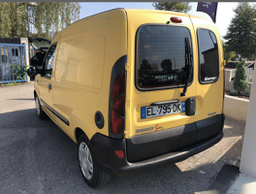

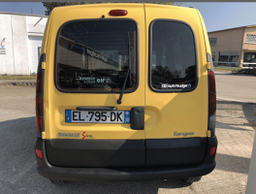

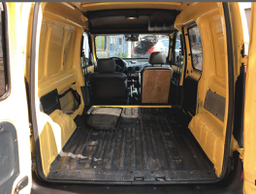

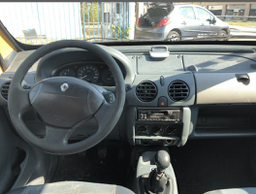

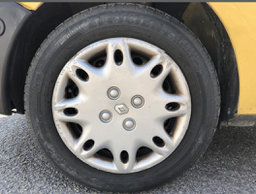



----- Citroen C4 Picasso -----


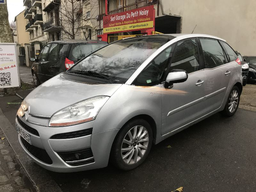

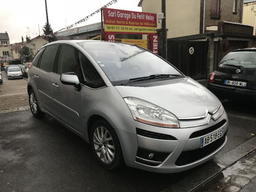

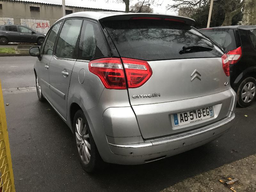

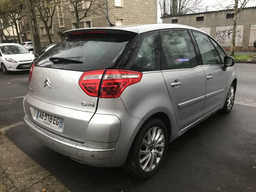

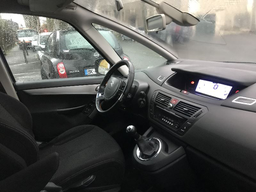



----- Renault Megane -----


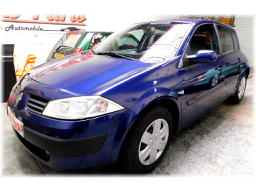

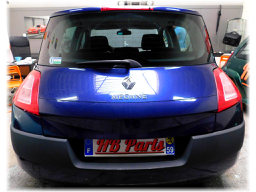

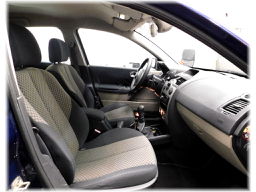

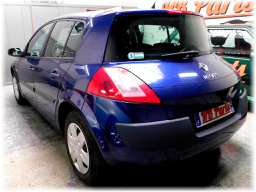

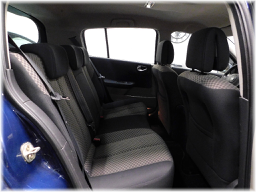

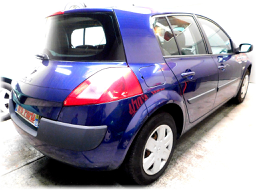

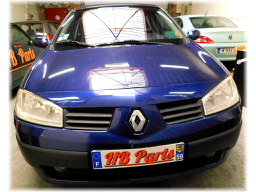

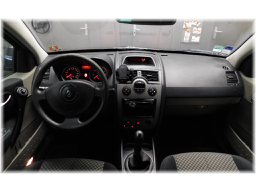

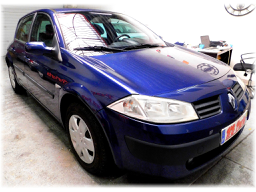



----- Nissan Almera Tino -----


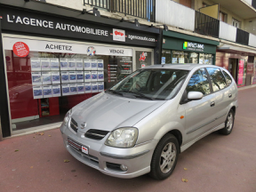

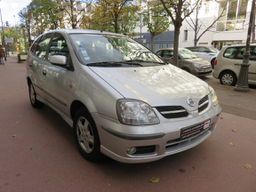

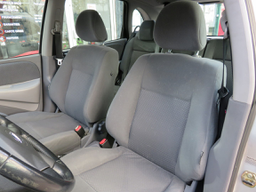

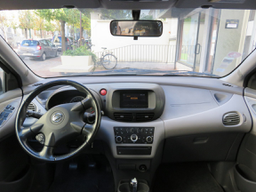

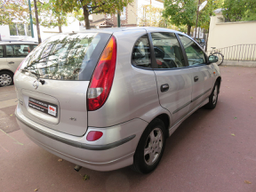

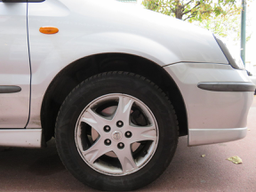

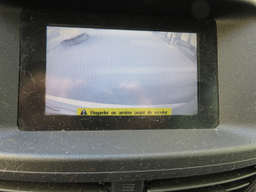

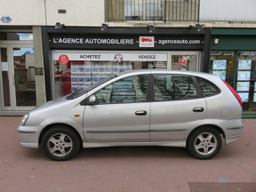

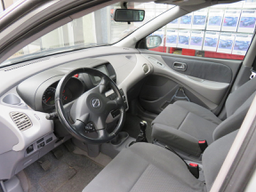

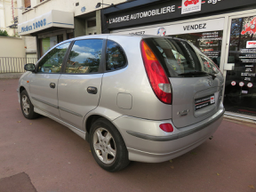

In [10]:
# scrapping per se

# NB: we dont't save the images to disk here,
# the point is only to show it is possible to
# download labeled images!

if nbModels != nbUrls:
    raise ValueError('inconsistent numbers of models vs. url lists: {} vs. {}'.format(nbModels, nbUrls))

for i in range(1,nbModels): # remove 0th as it is not an actual car at the time I test the request
    print('\n\n----- {} -----'.format(models[i]))
    for u in imgUrlList[i]:
        u_r = requests.get(u, stream=True)
        u_r.raw.decode_content = True # handle spurious Content-Encoding
        im = Image.open(u_r.raw)
        im.thumbnail((2**8,2**8), Image.ANTIALIAS) # just to ease vizualization here (acts inplace)
        display(im) 